In [42]:
import matplotlib.pyplot as plt 
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,3)
from statsmodels.graphics.tsaplots import plot_acf
import numpy as np 
from numpy.fft import rfftfreq, irfft
from numpy.random import normal
from IPython.display import Audio
import random
from scipy.io.wavfile import *
import librosa
from librosa import display

## Nyquist-Shannon theorem

* A signal containing no frequency components above x Hz is completely determined by specifying its values on a discrete grid with strictly more than 2x time-points per second.

* We only care to represent frequency components up to ~20000Hz (human hearing range), hence framerate > 40000 frames/s. Typical value is 44100 frames/s.

In [2]:
FRAMERATE = 44100

# Wav representation

* Discretize time: fixed number of frames per second (framerate)
* Compute the value of a sinusoid at each time frame
* The resulting array of values is a representation of the sound wave

In [3]:
def sine(freq = 440, duration = 1, framerate = FRAMERATE):
    #Returns array of sine-wave values with given frequency (in Hz) and duration (in s)
    
    t = np.linspace(0, duration, framerate * duration) # create temporal grid (one time-point per frame)
    wave = np.sin(2 * np.pi * freq * t) # each timepoint is assigned the value of the sine wave with frequency freq at that time point
    
    return wave


pure_sinusoid = sine(220)
pure_sinusoid

array([ 0.00000000e+00,  3.13402667e-02,  6.26497429e-02, ...,
       -6.26497429e-02, -3.13402667e-02,  3.13806691e-14])

In [4]:
len(pure_sinusoid)

44100

In [5]:
def play_sound(wave, framerate = FRAMERATE):
    #Plays a sound wave expressed as an array of values
    return Audio(wave, rate = framerate, autoplay=True)

play_sound(pure_sinusoid)

# Additive synthesis

In [6]:
def silence(duration, framerate = FRAMERATE):
    #Returns array of silence
    nb = int(framerate * duration)
    t = np.linspace(0, duration, nb)
    
    return 0*t


def synthesis(waves, framerate = FRAMERATE):
    #Returns additive synthesis of a list of waves (padding with silence if length is unequal)
    
    max_length = max([len(wave) for wave in waves])
    uniform_waves = [np.concatenate([wave, silence(int(max_length-len(wave))/framerate)]) for wave in waves] #all waves reach max_length
        
    return sum(uniform_waves)  

harmonic_sound = synthesis([sine(220*k) for k in range(1, 10)])
harmonic_sound

array([ 0.00000000e+00,  1.40017909e+00,  2.73890045e+00, ...,
       -2.73890045e+00, -1.40017909e+00, -8.61606644e-13])

In [7]:
play_sound(harmonic_sound)

/home/alexandre/miniconda3/envs/algo/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/alexandre/miniconda3/envs/algo/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/alexandre/miniconda3/envs/algo/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


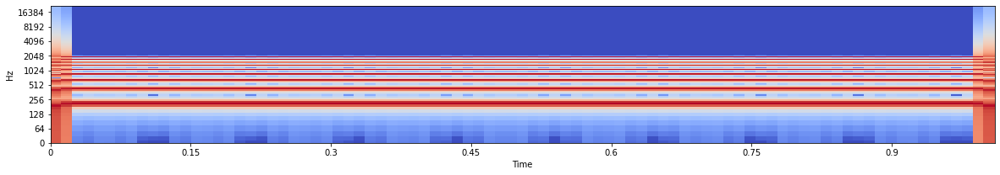

In [8]:
def show_spectrogram(wave):
    #Shows spectrogram of input wave
    X = librosa.stft(wave)
    Xdb = librosa.amplitude_to_db(abs(X))
    librosa.display.specshow(Xdb, sr=FRAMERATE, x_axis='time', y_axis='log')
    
show_spectrogram(harmonic_sound)

# Envelope

Multiply soundwave by a function describing the shape of the envelope

In [9]:
def exp_decay(wave, coef = 5, framerate = FRAMERATE):
    duration = len(wave)/framerate
    t = np.linspace(0, duration, framerate * duration)
    return np.exp(-coef*t)*wave

#exponential_decay = exp_decay(harmonic_sound)

In [10]:
#play_sound(exponential_decay)

In [11]:
#librosa.display.waveplot(exponential_decay, sr=FRAMERATE);

## An example
* Two sounds (1s and 2s). 
* Each sound has an overarching 2Hz sinusoidal envelope. 
* First sound is a 440Hz sinusoid. 
* Second sound is a harmonic complex with 10 partials with decreasing amplitude. Each partial decays exponentially over a progressively decreasing duration (the timbre of the second sound changes over its 2s duration).

In [20]:
sound_blobs = sine(freq = 2, duration = 3)*np.concatenate([exp_decay(sine(440)), synthesis([(1/k)*exp_decay(sine(freq = 220*k, duration = 2/k)) for k in range(1, 10)])])
play_sound(sound_blobs)

TypeError: 'float' object cannot be interpreted as an integer

In [21]:
librosa.display.waveplot(sound_blobs, sr=FRAMERATE);

NameError: name 'sound_blobs' is not defined

## Attack, Decay, Sustain, Release

In [22]:
def lin_envelope(wave, start_level = 1, end_level = 0,  framerate = FRAMERATE):
    # Linear envelope
    t = np.linspace(start_level, end_level, len(wave))
    return t*wave
    
def envelope(wave, decay_amplitude, split, begin = 0, end = 0):
    #Apply ADSR envelope to wave. Decay amplitude is expressed as a fraction of 1, splits is a 3-ple of fractions of the duration of wave

    attack = lin_envelope(wave[:int(len(wave)*split[0])], start_level = begin, end_level = 1)
    decay = lin_envelope(wave[int(len(wave)*split[0]):int(len(wave)*split[1])], start_level = 1, end_level = decay_amplitude)
    sustain = decay_amplitude*wave[int(len(wave)*split[1]):int(len(wave)*split[2])]
    release = lin_envelope(wave[int(len(wave)*split[2]):], start_level = decay_amplitude, end_level = end)
    
    return np.concatenate([attack, decay, sustain, release])


sound_with_envelope = envelope(harmonic_sound, 1/10, [1/10, 2/10, 9/10])
play_sound(sound_with_envelope)

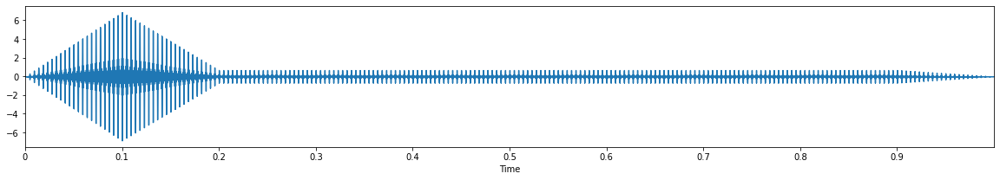

In [23]:
librosa.display.waveplot(sound_with_envelope, sr=FRAMERATE);

In [29]:
def gaussian_noise(power, duration = 1, framerate = FRAMERATE, min_frequency = 20, max_frequency = 20000):
    length = duration * framerate
    
    sample_frequencies = rfftfreq(length)
    
    # frequency is in hertz = 1/s => the order is reversed for time periods
    min_period = 1 / float(max_frequency)
    max_period = 1 / float(min_frequency)
    
#    min_frequency = max(min_frequency, 1./length) # Low frequency cutoff
    
    nb_low_period   = npsum(sample_frequencies < min_period)   # Index of the cutoff
    if nb_low_period > 0 and nb_low_period < len(sample_frequencies):
        sample_frequencies[:nb_low_period] = sample_frequencies[nb_low_period]
        
    nb_high_period = npsum(sample_frequencies > max_period)
    if nb_high_period > 0 and nb_high_period < len(sample_frequencies):
        index = len(sample_frequencies) - nb_high_period
        sample_frequencies[index:] = sample_frequencies[index - 1]
    
    # scaling factors
    scaling_factors = sample_frequencies ** (-power/2.0)
    
    # Calculate theoretical output standard deviation from scaling
    w      = scaling_factors[1:].copy()
    w[-1] *= (1 + (length % 2)) / 2. # correct f = +-0.5
    sigma = 2 * sqrt(npsum(w**2)) / length
    
    # Generate scaled random power + phase
    
    print(scaling_factors.shape)
    print(length)
    sr = normal(scale=scaling_factors, size=np.array([len(sample_frequencies)]))
    si = normal(scale=scaling_factors, size=np.array([len(sample_frequencies)]))
    
    # If the signal length is even, frequencies +/- 0.5 are equal
    # so the coefficient must be real.
    if not (length % 2): si[...,-1] = 0
    
    # Regardless of signal length, the DC component must be real
    si[...,0] = 0
    
    # Combine power + corrected phase to Fourier components
    s  = sr + 1J * si
    
    # Transform to real time series & scale to unit variance
    y = irfft(s, n=length, axis=-1) / sigma
    
    return y

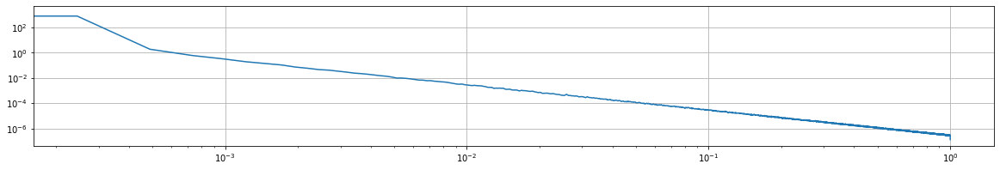

In [32]:
out = gaussian_noise(2, duration = 100)


# optionally plot the Power Spectral Density with Matplotlib
from matplotlib import mlab
from matplotlib import pylab as plt
s, f = mlab.psd(y, NFFT=2**13)
plt.loglog(f,s)
plt.grid(True)
plt.show()

In [30]:
out = gaussian_noise(3, duration = 100)
out

(2205001,)
4410000


array([-0.04892783, -0.04974887, -0.04668576, ..., -0.04624222,
       -0.04926256, -0.04859614])

In [31]:
play_sound(out)

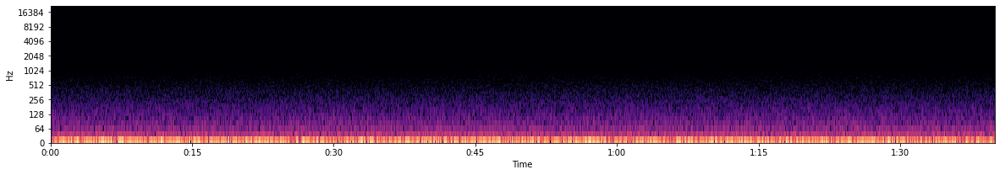

In [44]:
show_spectrogram(out)